<a href="https://colab.research.google.com/github/garfield-gray/Calculations/blob/main/DimentionReduction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#what is Dimention?!

## video

In [12]:
from IPython.display import Video
drive.mount('/content/drive')
video_path = 'drive/MyDrive/Uni/LAandOptimization/dimentionReduction/Ex.mp4'

# Display the video with sound
Video(video_path, embed=True)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


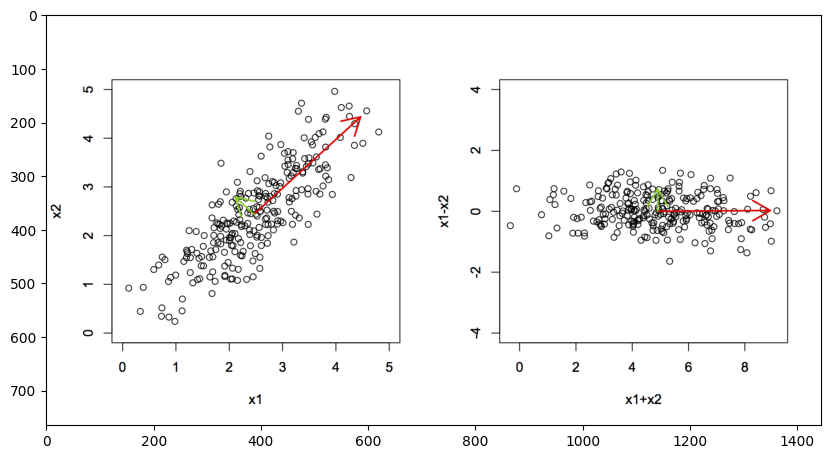

In [3]:
import matplotlib.pyplot as plt
ima = plt.imread("drive/MyDrive/Uni/LAandOptimization/dimentionReduction/pca2.png", ".png")
fig = plt.figure(figsize=(10, 10))
plt.imshow(ima)
plt.show()

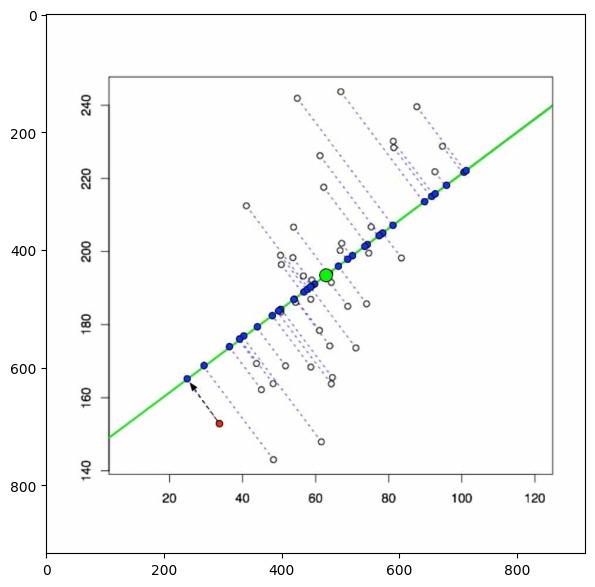

In [6]:
import matplotlib.pyplot as plt
ima = plt.imread("drive/MyDrive/Uni/LAandOptimization/dimentionReduction/pca1.jpg", ".jpg")
fig = plt.figure(figsize=(7, 7))
plt.imshow(ima)
plt.show()

Dimention Reduction Has two major branch

# 1- SVD

In [48]:
import numpy as np
from google.colab import drive

drive.mount('/content/drive')
im = plt.imread("drive/MyDrive/Uni/LAandOptimization/dimentionReduction/lena.jpg", ".jpg")
gray = im@np.array([1/3,1/3,1/3])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


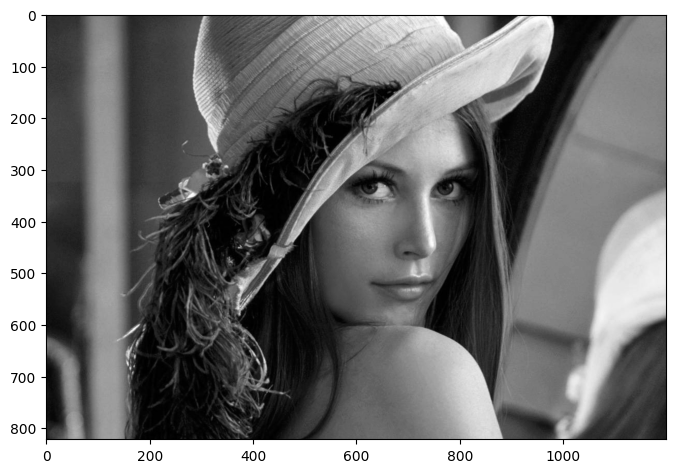

In [50]:
fig = plt.figure(figsize=(8, 8))
plt.imshow(gray, cmap='gray')
plt.show()

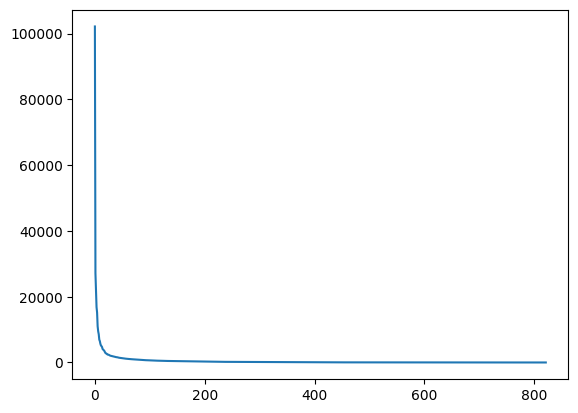

In [81]:
u, s, vh = np.linalg.svd(gray)
plt.plot(s)
plt.show()

In [98]:
u, s, vh = np.linalg.svd(gray)
print(s.shape)
cut = np.zeros([s.shape[0], s.shape[0]])
for i in range(200):
  cut[i,i] = 1
s = s@cut
print(s.shape)
cut.shape

(822,)
(822,)


(822, 822)

In [99]:
newIm = u@np.hstack((np.diag(s), np.zeros([u.shape[0], vh.shape[0]-u.shape[0]])))@vh

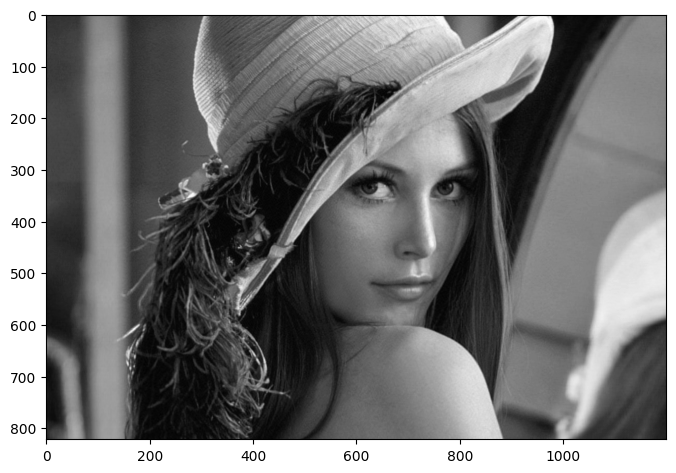

In [100]:
# fig = plt.figure(figsize=(0.5, 0.5))
fig = plt.figure(figsize=(8, 8))
plt.imshow(newIm, cmap='gray')
plt.show()

# 2-PCA

In [21]:
import pandas as pd


In [22]:
from sklearn import datasets
from sklearn.decomposition import PCA
import numpy as np
from numpy import array,hstack,ones,zeros,arange,random,exp

data = datasets.load_iris()
D = data.data
D.shape

(150, 4)

In [34]:

Dr = PCA(0.9).fit_transform(D)
# Dr = D
n,d = Dr.shape
k = 3

dict = {0:[1,0,0],
        1:[0,1,0],
        2:[0,0,1]}
Y = array(list(map(lambda x:dict[x],data.target)))
X = hstack((ones((n,1)),Dr))

W0 = zeros((k,d+1))
W = W0.copy()

eta,eps = 0.005,1e-4
epoch = 1

import time
t = time.time()

while True:
    ii = arange(n)
    random.shuffle(ii)
    for i in ii:
        W[:2] = W0[:2] + eta*((Y[i]-exp(W0@X[i])/sum(exp(W0@X[i]))).reshape((k,1))*X[i].reshape((1,d+1)))[:2]
        chg = np.all(abs(W[:2]-W0[:2])) < eps
        W0 = W.copy()
    epoch += 1
    if (chg) | (epoch > 1e3): break
print(time.time()-t)
print(W.round(3))

5.497846841812134
[[-0.673 -8.307]
 [ 5.142 -4.048]
 [ 0.     0.   ]]


In [37]:
i = 120
((exp(W@X[i:i+10].T)/np.sum(exp(W@X[i:i+10].T), axis = 0)).round(0).T) == Y[i:i+10]

array([[ True,  True,  True],
       [ True, False, False],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True, False, False],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True]])

In [38]:
Yc = ((exp(W@X.T)/sum(exp(W@X.T))).round(0).T)

In [39]:
co = 0
for i in range(150):
  if (Yc[i] != Y[i]).any():
    co +=1
co

10

In [42]:
data.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [43]:
D.shape

(150, 4)

In [44]:
Dr.shape

(150, 1)

In [45]:
print(D[50], D[79])

[7.  3.2 4.7 1.4] [5.7 2.6 3.5 1. ]


In [46]:
Dr[50], Dr[79]

(array([1.28482569]), array([-0.30558378]))

In [ ]:
from sklearn import datasets
from sklearn.decomposition import PCA
import numpy as np
from numpy import array,hstack,ones,zeros,arange,random,exp




data = datasets.load_wine()
D = data.data
# Dr = PCA(0.9).fit_transform(D)
Dr = D
n,d = Dr.shape
k = 3

dict = {0:[1,0,0],
        1:[0,1,0],
        2:[0,0,1]}
Y = array(list(map(lambda x:dict[x],data.target)))
X = hstack((ones((n,1)),Dr))

W0 = zeros((k,d+1), dtype=np.float128)
W = W0.copy()

eta,eps = 0.005,1e-4
epoch = 1

import time
t = time.time()

while True:
    ii = arange(n)
    random.shuffle(ii)
    for i in ii:
        W[:2] = W0[:2] + eta*((Y[i]-exp(W0@X[i])/sum(exp(W0@X[i]))).reshape((k,1))*X[i].reshape((1,d+1)))[:2]
        chg = np.all(abs(W[:2]-W0[:2])) < eps
        W0 = W.copy()
    epoch += 1
    if (chg) | (epoch > 1e3): break
print(time.time()-t)
print(W.round(3))

0.0195925235748291
[[-1.2700e-01 -1.4530e+00 -3.6000e-01 -2.8000e-01 -3.1140e+00 -1.0907e+01
  -1.6400e-01 -2.0000e-02 -6.7000e-02 -1.3300e-01 -4.4800e-01 -9.9000e-02
  -2.1400e-01 -8.5000e-01]
 [ 9.1000e-02  9.5300e-01  7.0000e-03  1.7700e-01  1.9250e+00  7.3090e+00
   2.1200e-01  2.2700e-01  3.3000e-02  1.6400e-01 -2.5600e-01  1.3000e-01
   3.3400e-01 -1.1890e+00]
 [ 0.0000e+00  0.0000e+00  0.0000e+00  0.0000e+00  0.0000e+00  0.0000e+00
   0.0000e+00  0.0000e+00  0.0000e+00  0.0000e+00  0.0000e+00  0.0000e+00
   0.0000e+00  0.0000e+00]]


In [ ]:
i = 120
((exp(W@X[i:i+10].T)/np.sum(exp(W@X[i:i+10].T), axis = 0)).round(0).T) == Y[i:i+10]

array([[ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True, False, False]])

In [ ]:
Yc = ((exp(W@X.T)/sum(exp(W@X.T))).round(0).T)

In [ ]:
co = 0
for i in range(150):
  if (Yc[i] != Y[i]).any():
    co +=1
co

87

In [ ]:
Y.shape

(178, 3)